# Confirmed Balkan Cinema Dataset

This notebook builds a **high-confidence** dataset of Balkan films.

**Strategy:** Only use sources that record *production country* directly — never IMDB region codes (which mean "released in that region", not "produced there").

| Source | Why trustworthy | Approx. Balkan count |
|--------|----------------|---------------------|
| Wikidata SPARQL | `country of origin` (P495) is explicitly set by editors | ~6 000 |
| TMDB `production_countries` | Explicit production country field | ~15 000 |
| Lumière Observatory | Curated European box-office, all Balkan | ~1 297 |

After merging these three on IMDB ID, we enrich with IMDB metadata (ratings, runtime, genres) from `title.basics.tsv` and `title.ratings.tsv`.

**What we do NOT use:** `title.akas.tsv` region codes — these caused the 80 k false positives in the previous dataset.

In [21]:
import pandas as pd
import numpy as np
import requests
import json
import time
import os
from tqdm import tqdm

pd.set_option('display.max_columns', 50)
pd.set_option('display.max_colwidth', 80)

# ---------------------------------------------------------------------------
# Balkan country definitions
# ---------------------------------------------------------------------------

# Wikidata QIDs for Balkan states (current + historical)
BALKAN_WIKIDATA_QIDS = [
    'Q222',   # Albania
    'Q225',   # Bosnia and Herzegovina
    'Q219',   # Bulgaria
    'Q224',   # Croatia
    'Q41',    # Greece
    'Q1246',  # Kosovo
    'Q236',   # Montenegro
    'Q221',   # North Macedonia
    'Q218',   # Romania
    'Q403',   # Serbia
    'Q215',   # Slovenia
    # Historical / predecessor states
    'Q36704',  # Yugoslavia (generic)
    'Q83164',  # Socialist Federal Republic of Yugoslavia
    'Q179323', # Kingdom of Yugoslavia
    'Q37024',  # Serbia and Montenegro
    'Q1020',   # People's Republic of Bulgaria
    'Q179723', # People's Republic of Romania
    'Q170100', # People's Socialist Republic of Albania
    'Q432732', # Socialist Republic of Slovenia
    'Q372100', # Socialist Republic of Croatia
    'Q192184', # Socialist Republic of Serbia
    'Q246160', # Socialist Republic of Macedonia
    'Q875185', # Socialist Republic of Bosnia and Herzegovina
]

# TMDB / full-text country names
BALKAN_COUNTRY_NAMES = {
    'Albania', 'Bosnia and Herzegovina', 'Bulgaria', 'Croatia', 'Greece',
    'Kosovo', 'Montenegro', 'North Macedonia', 'Macedonia', 'Romania',
    'Serbia', 'Slovenia', 'Yugoslavia', 'Socialist Federal Republic of Yugoslavia',
    'Kingdom of Yugoslavia', 'Serbia and Montenegro',
}

# Lumière ISO-3166 codes (plus historical YU / CS)
BALKAN_ISO = {'AL', 'BA', 'BG', 'HR', 'GR', 'XK', 'ME', 'MK', 'RO', 'RS', 'SI', 'YU', 'CS'}

print('Setup complete.')

Setup complete.


## 1. Wikidata SPARQL — `country of origin` (P495)

We query each Balkan country separately to avoid endpoint timeouts, then combine.

In [22]:
WIKIDATA_SPARQL_URL = 'https://query.wikidata.org/sparql'
WIKIDATA_HEADERS = {
    'User-Agent': 'BalkanCinemaResearch/1.0 (academic; contact: research@example.com)',
    'Accept': 'application/sparql-results+json',
}

def sparql_query_country(qid: str, country_label: str, retries: int = 3) -> pd.DataFrame:
    """
    Query Wikidata for all films (and film subtypes) with country of origin = qid.
    Returns a flat DataFrame with one row per (film, director) pair.
    """
    query = f"""
SELECT ?film ?filmLabel ?imdbId ?year ?directorLabel ?genreLabel WHERE {{
  ?film wdt:P31/wdt:P279* wd:Q11424 .   # instance of film (or subclass)
  ?film wdt:P495 wd:{qid} .             # country of origin
  OPTIONAL {{ ?film wdt:P345 ?imdbId }}
  OPTIONAL {{
    ?film wdt:P577 ?pubdate .
    BIND(YEAR(?pubdate) AS ?year)
  }}
  OPTIONAL {{ ?film wdt:P57 ?director }}
  OPTIONAL {{ ?film wdt:P136 ?genre }}
  SERVICE wikibase:label {{ bd:serviceParam wikibase:language "en,fr,de,sq,bs,bg,hr,el,mk,ro,sr,sl" }}
}}
"""
    for attempt in range(retries):
        try:
            resp = requests.get(
                WIKIDATA_SPARQL_URL,
                params={'query': query, 'format': 'json'},
                headers=WIKIDATA_HEADERS,
                timeout=120,
            )
            resp.raise_for_status()
            # Use raw text decode to avoid strict JSON issues with control chars
            text = resp.content.decode('utf-8', errors='replace')
            data = json.loads(text)
            bindings = data['results']['bindings']
            rows = []
            for b in bindings:
                rows.append({
                    'wikidata_id': b['film']['value'].split('/')[-1],
                    'title': b.get('filmLabel', {}).get('value', ''),
                    'imdb_id': b.get('imdbId', {}).get('value', None),
                    'year': b.get('year', {}).get('value', None),
                    'director': b.get('directorLabel', {}).get('value', None),
                    'genre': b.get('genreLabel', {}).get('value', None),
                    'wikidata_country_qid': qid,
                    'wikidata_country': country_label,
                })
            return pd.DataFrame(rows)
        except Exception as e:
            print(f'    Attempt {attempt+1} failed for {country_label}: {e}')
            if attempt < retries - 1:
                time.sleep(10 * (attempt + 1))
    return pd.DataFrame()


# Country QID → display name mapping
COUNTRY_QUERY_MAP = {
    'Q222':   'Albania',
    'Q225':   'Bosnia and Herzegovina',
    'Q219':   'Bulgaria',
    'Q224':   'Croatia',
    'Q41':    'Greece',
    'Q1246':  'Kosovo',
    'Q236':   'Montenegro',
    'Q221':   'North Macedonia',
    'Q218':   'Romania',
    'Q403':   'Serbia',
    'Q215':   'Slovenia',
    'Q36704':  'Yugoslavia',
    'Q83164':  'Socialist Federal Republic of Yugoslavia',
    'Q179323': 'Kingdom of Yugoslavia',
    'Q37024':  'Serbia and Montenegro',
    'Q1020':   "People's Republic of Bulgaria",
    'Q179723': "People's Republic of Romania",
    'Q170100': "People's Socialist Republic of Albania",
    'Q432732': 'Socialist Republic of Slovenia',
    'Q372100': 'Socialist Republic of Croatia',
    'Q192184': 'Socialist Republic of Serbia',
    'Q246160': 'Socialist Republic of Macedonia',
    'Q875185': 'Socialist Republic of Bosnia and Herzegovina',
}

print(f'Will query {len(COUNTRY_QUERY_MAP)} country entities from Wikidata.')

Will query 23 country entities from Wikidata.


In [23]:
# Run all queries — takes 3-8 minutes
all_frames = []

for qid, label in tqdm(COUNTRY_QUERY_MAP.items(), desc='Wikidata queries'):
    df_country = sparql_query_country(qid, label)
    print(f'  {label}: {len(df_country)} raw rows')
    all_frames.append(df_country)
    time.sleep(2)  # be polite to the endpoint

df_wiki_raw = pd.concat(all_frames, ignore_index=True)
print(f'\nTotal raw rows from Wikidata: {len(df_wiki_raw)}')
print(f'Unique film QIDs: {df_wiki_raw["wikidata_id"].nunique()}')

Wikidata queries:   0%|          | 0/23 [00:00<?, ?it/s]

  Albania: 702 raw rows


Wikidata queries:   4%|▍         | 1/23 [00:17<06:19, 17.27s/it]

  Bosnia and Herzegovina: 206 raw rows


Wikidata queries:   9%|▊         | 2/23 [00:29<05:03, 14.44s/it]

  Bulgaria: 1141 raw rows


Wikidata queries:  13%|█▎        | 3/23 [00:53<06:13, 18.67s/it]

  Croatia: 778 raw rows


Wikidata queries:  17%|█▋        | 4/23 [01:16<06:30, 20.54s/it]

  Greece: 1872 raw rows


Wikidata queries:  22%|██▏       | 5/23 [02:01<08:45, 29.18s/it]

  Kosovo: 64 raw rows


Wikidata queries:  26%|██▌       | 6/23 [02:04<05:45, 20.30s/it]

  Montenegro: 53 raw rows


Wikidata queries:  30%|███       | 7/23 [02:51<07:43, 28.97s/it]

  North Macedonia: 234 raw rows


Wikidata queries:  35%|███▍      | 8/23 [03:17<07:01, 28.08s/it]

  Romania: 2807 raw rows


Wikidata queries:  39%|███▉      | 9/23 [04:08<08:11, 35.13s/it]

  Serbia: 868 raw rows


Wikidata queries:  43%|████▎     | 10/23 [04:23<06:16, 28.99s/it]

  Slovenia: 629 raw rows


Wikidata queries:  48%|████▊     | 11/23 [04:40<05:03, 25.26s/it]

  Yugoslavia: 1868 raw rows


Wikidata queries:  52%|█████▏    | 12/23 [04:52<03:53, 21.23s/it]

  Socialist Federal Republic of Yugoslavia: 0 raw rows


Wikidata queries:  57%|█████▋    | 13/23 [04:54<02:34, 15.48s/it]

  Kingdom of Yugoslavia: 0 raw rows


Wikidata queries:  61%|██████    | 14/23 [04:56<01:43, 11.55s/it]

  Serbia and Montenegro: 26 raw rows


Wikidata queries:  65%|██████▌   | 15/23 [04:59<01:11,  8.96s/it]

  People's Republic of Bulgaria: 5 raw rows


Wikidata queries:  70%|██████▉   | 16/23 [05:08<01:03,  9.03s/it]

  People's Republic of Romania: 0 raw rows


Wikidata queries:  74%|███████▍  | 17/23 [05:11<00:42,  7.08s/it]

  People's Socialist Republic of Albania: 0 raw rows


Wikidata queries:  78%|███████▊  | 18/23 [05:13<00:28,  5.68s/it]

  Socialist Republic of Slovenia: 0 raw rows


Wikidata queries:  83%|████████▎ | 19/23 [05:16<00:18,  4.68s/it]

  Socialist Republic of Croatia: 0 raw rows


Wikidata queries:  87%|████████▋ | 20/23 [05:18<00:11,  3.96s/it]

  Socialist Republic of Serbia: 0 raw rows


Wikidata queries:  91%|█████████▏| 21/23 [05:20<00:06,  3.47s/it]

  Socialist Republic of Macedonia: 0 raw rows


Wikidata queries:  96%|█████████▌| 22/23 [05:23<00:03,  3.11s/it]

  Socialist Republic of Bosnia and Herzegovina: 0 raw rows


Wikidata queries: 100%|██████████| 23/23 [05:25<00:00, 14.15s/it]


Total raw rows from Wikidata: 11253
Unique film QIDs: 6712


In [24]:
# Aggregate: one row per film, pipe-joined directors / genres / countries
def agg_pipe(series):
    vals = sorted(set(series.dropna().astype(str)))
    return '|'.join(vals) if vals else None

df_wiki = (
    df_wiki_raw
    .groupby('wikidata_id', sort=False)
    .agg(
        title=('title', 'first'),
        imdb_id=('imdb_id', 'first'),
        year=('year', 'first'),
        director=('director', agg_pipe),
        genres_wiki=('genre', agg_pipe),
        country=('wikidata_country', agg_pipe),
    )
    .reset_index()
)

df_wiki['year'] = pd.to_numeric(df_wiki['year'], errors='coerce')
df_wiki['source'] = 'wikidata'

# Drop films where the title is just the QID (missing labels — usually data issues)
df_wiki = df_wiki[~df_wiki['title'].str.match(r'^Q\d+$', na=False)]

print(f'Wikidata confirmed films: {len(df_wiki)}')
print(f'With IMDB ID: {df_wiki["imdb_id"].notna().sum()}')
print('\nCountry breakdown:')
print(df_wiki['country'].str.split('|').explode().value_counts().head(15))

Wikidata confirmed films: 6654
With IMDB ID: 5529

Country breakdown:
country
Romania                          1832
Yugoslavia                       1244
Greece                           1136
Bulgaria                          724
Albania                           614
Serbia                            491
Croatia                           345
Slovenia                          227
Bosnia and Herzegovina             93
North Macedonia                    89
Kosovo                             38
Montenegro                         19
Serbia and Montenegro              14
People's Republic of Bulgaria       5
Name: count, dtype: int64


## 2. TMDB — `production_countries` field

In [25]:
print('Loading TMDB dataset (~1.4M rows)...')
tmdb_raw = pd.read_csv('data/tmdb_movies.csv', low_memory=False)
print(f'  Loaded {len(tmdb_raw)} TMDB entries')

# The production_countries column is comma-separated full country names
def has_balkan_tmdb(val):
    if pd.isna(val):
        return False
    return any(c in str(val) for c in BALKAN_COUNTRY_NAMES)

tmdb_mask = tmdb_raw['production_countries'].apply(has_balkan_tmdb)
df_tmdb = tmdb_raw[tmdb_mask].copy()
print(f'  Balkan TMDB films: {len(df_tmdb)}')

# Clean up
df_tmdb = df_tmdb.rename(columns={
    'id': 'tmdb_id',
    'title': 'title_tmdb',
    'original_title': 'original_title_tmdb',
    'release_date': 'release_date_tmdb',
    'vote_average': 'tmdb_rating',
    'vote_count': 'tmdb_votes',
    'overview': 'plot_overview',
    'production_countries': 'production_countries_tmdb',
    'genres': 'genres_tmdb',
    'production_companies': 'production_companies_tmdb',
    'original_language': 'original_language',
})

df_tmdb['year_tmdb'] = pd.to_datetime(
    df_tmdb['release_date_tmdb'], errors='coerce'
).dt.year

df_tmdb['source'] = 'tmdb'

# Keep only useful columns
tmdb_cols = [
    'tmdb_id', 'imdb_id', 'title_tmdb', 'original_title_tmdb',
    'year_tmdb', 'tmdb_rating', 'tmdb_votes', 'runtime',
    'budget', 'revenue', 'plot_overview', 'original_language',
    'production_countries_tmdb', 'genres_tmdb', 'production_companies_tmdb',
    'source',
]
df_tmdb = df_tmdb[[c for c in tmdb_cols if c in df_tmdb.columns]]

print('\nTMDB country breakdown (top 15):')
print(df_tmdb['production_countries_tmdb'].value_counts().head(15))

Loading TMDB dataset (~1.4M rows)...
  Loaded 1392699 TMDB entries
  Balkan TMDB films: 15759

TMDB country breakdown (top 15):
production_countries_tmdb
Greece                               3372
Yugoslavia                           2406
Romania                              1800
Bulgaria                              970
Croatia                               961
Serbia                                907
Slovenia                              743
Macedonia                             482
Bosnia and Herzegovina                289
Albania                               282
Kosovo                                219
Montenegro                             79
Serbia and Montenegro                  76
Romania, United States of America      63
France, Greece                         51
Name: count, dtype: int64


## 4. IMDB enrichment data (title.basics + title.ratings)

In [26]:
# Load only movies from title.basics (chunked to save memory)
print('Loading IMDB title.basics (movies only, chunked)...')
imdb_chunks = []
for chunk in pd.read_csv(
    'data/title.basics.tsv', sep='\t', na_values='\\N',
    low_memory=False, chunksize=500_000,
):
    movies = chunk[chunk['titleType'].isin(['movie', 'tvMovie'])]
    imdb_chunks.append(movies[[
        'tconst', 'primaryTitle', 'originalTitle',
        'startYear', 'runtimeMinutes', 'genres',
    ]])

df_imdb_basics = pd.concat(imdb_chunks, ignore_index=True)
df_imdb_basics.columns = ['imdb_id', 'primary_title_imdb', 'original_title_imdb',
                           'year_imdb', 'runtime_imdb', 'genres_imdb']
df_imdb_basics['year_imdb'] = pd.to_numeric(df_imdb_basics['year_imdb'], errors='coerce')
df_imdb_basics['runtime_imdb'] = pd.to_numeric(df_imdb_basics['runtime_imdb'], errors='coerce')
print(f'  IMDB movies loaded: {len(df_imdb_basics)}')

# Ratings
print('Loading IMDB title.ratings...')
df_imdb_ratings = pd.read_csv('data/title.ratings.tsv', sep='\t', na_values='\\N')
df_imdb_ratings.columns = ['imdb_id', 'imdb_rating', 'imdb_votes']
print(f'  IMDB ratings loaded: {len(df_imdb_ratings)}')

# Merge basics + ratings
df_imdb = df_imdb_basics.merge(df_imdb_ratings, on='imdb_id', how='left')
print(f'  Combined IMDB lookup: {len(df_imdb)} rows')

Loading IMDB title.basics (movies only, chunked)...
  IMDB movies loaded: 895799
Loading IMDB title.ratings...
  IMDB ratings loaded: 1652901
  Combined IMDB lookup: 895799 rows


## 5. Merge all confirmed sources

In [27]:
# ── Step A: Wikidata as the base ──────────────────────────────────────────
# Enrich with IMDB data where we have an imdb_id
df_wiki_enriched = df_wiki.merge(
    df_imdb, on='imdb_id', how='left'
)

# ── Step B: TMDB — merge with Wikidata on imdb_id, then add TMDB-only ────
# Films in TMDB that are ALSO in Wikidata: enrich the wikidata rows
wiki_imdb_ids = set(df_wiki['imdb_id'].dropna())

tmdb_has_imdb = df_tmdb[df_tmdb['imdb_id'].notna()].copy()
tmdb_only = tmdb_has_imdb[~tmdb_has_imdb['imdb_id'].isin(wiki_imdb_ids)].copy()
tmdb_no_imdb = df_tmdb[df_tmdb['imdb_id'].isna()].copy()

print(f'Wikidata films: {len(df_wiki_enriched)}')
print(f'TMDB films not in Wikidata (with IMDB ID): {len(tmdb_only)}')
print(f'TMDB films with no IMDB ID: {len(tmdb_no_imdb)}')

# Enrich TMDB-only films with IMDB data
tmdb_only_enriched = tmdb_only.merge(df_imdb, on='imdb_id', how='left')

Wikidata films: 6654
TMDB films not in Wikidata (with IMDB ID): 7474
TMDB films with no IMDB ID: 4291


In [28]:
# ── Step C: Build the master DataFrame ───────────────────────────────────
# We will unify column names into a consistent schema

def make_standard_row(row, source_tier):
    """Not used directly — we do vectorised operations below."""
    pass

# Wikidata block
wk = df_wiki_enriched.copy()
wk['title_final']       = wk['title']
wk['original_title']    = wk['original_title_imdb'].fillna(wk['title'])
wk['year_final']        = wk['year'].fillna(wk['year_imdb'])
wk['runtime_final']     = wk['runtime_imdb']
wk['genres_final']      = wk['genres_imdb'].fillna(wk['genres_wiki'])
wk['director_names']    = wk['director']
wk['production_countries'] = None
wk['production_companies'] = None
wk['plot_overview']     = None
wk['tmdb_id']           = None
wk['tmdb_rating']       = None
wk['tmdb_votes']        = None
wk['budget_final']      = None
wk['revenue_final']     = None
wk['source_tier']       = 'wikidata_confirmed'

# TMDB-only block (with IMDB id)
tm = tmdb_only_enriched.copy()
tm['wikidata_id']       = None
tm['title_final']       = tm['title_tmdb']
tm['original_title']    = tm.get('original_title_imdb', tm['original_title_tmdb']).fillna(tm['original_title_tmdb'])
tm['year_final']        = tm['year_imdb'].fillna(tm['year_tmdb'])
tm['runtime_final']     = tm.get('runtime_imdb', tm.get('runtime'))
tm['genres_final']      = tm.get('genres_imdb', tm.get('genres_tmdb'))
tm['director_names']    = None
tm['country']           = tm['production_countries_tmdb']
tm['director']          = None
tm['genres_wiki']       = None
tm['production_countries'] = tm['production_countries_tmdb']
tm['production_companies'] = tm.get('production_companies_tmdb')
tm['budget_final']      = pd.to_numeric(tm.get('budget'), errors='coerce').replace(0, np.nan)
tm['revenue_final']     = pd.to_numeric(tm.get('revenue'), errors='coerce').replace(0, np.nan)
tm['source_tier']       = 'tmdb_confirmed'

STANDARD_COLS = [
    'wikidata_id', 'imdb_id', 'tmdb_id',
    'title_final', 'original_title', 'year_final',
    'country', 'director_names', 'genres_final', 'runtime_final',
    'imdb_rating', 'imdb_votes', 'tmdb_rating', 'tmdb_votes',
    'budget_final', 'revenue_final', 'plot_overview',
    'production_countries', 'production_companies', 'original_language',
    'source_tier',
]

def to_standard(df):
    for col in STANDARD_COLS:
        if col not in df.columns:
            df[col] = None
    return df[STANDARD_COLS]

block_wiki = to_standard(wk)
block_tmdb = to_standard(tm)

print(f'Wikidata block: {len(block_wiki)}')
print(f'TMDB-only block: {len(block_tmdb)}')

Wikidata block: 6654
TMDB-only block: 7474


In [30]:
# ── Step E: Combine all blocks ────────────────────────────────────────────
df_master = pd.concat([block_wiki, block_tmdb], ignore_index=True)
print(f'Combined (before dedup): {len(df_master)}')

# Deduplicate: prefer wikidata > tmdb for same imdb_id
tier_order = {'wikidata_confirmed': 0, 'tmdb_confirmed': 1}
df_master['_tier_rank'] = df_master['source_tier'].map(tier_order)
df_master = df_master.sort_values('_tier_rank')

# Dedup by imdb_id (keep highest-priority source)
has_imdb = df_master[df_master['imdb_id'].notna()].drop_duplicates(subset='imdb_id', keep='first')
no_imdb  = df_master[df_master['imdb_id'].isna()]

df_master = pd.concat([has_imdb, no_imdb], ignore_index=True)
df_master = df_master.drop(columns=['_tier_rank'])

print(f'After deduplication: {len(df_master)}')
print('\nSource tier breakdown:')
print(df_master['source_tier'].value_counts())

Combined (before dedup): 14128
After deduplication: 14124

Source tier breakdown:
source_tier
tmdb_confirmed        7471
wikidata_confirmed    6653
Name: count, dtype: int64


In [31]:
# ── Step F: Enrich merged IMDB data for rows that have an imdb_id ─────────
# For wikidata rows we already merged above; for lumiere-matched and tmdb rows,
# fill in any missing IMDB fields now.

imdb_map = df_imdb.set_index('imdb_id')

def fill_from_imdb(df):
    df = df.copy()
    ids = df['imdb_id'].dropna()
    matched = imdb_map.reindex(ids)

    # Fill year
    mask = df['year_final'].isna() & df['imdb_id'].notna()
    df.loc[mask, 'year_final'] = df.loc[mask, 'imdb_id'].map(imdb_map['year_imdb'])

    # Fill runtime
    mask = df['runtime_final'].isna() & df['imdb_id'].notna()
    df.loc[mask, 'runtime_final'] = df.loc[mask, 'imdb_id'].map(imdb_map['runtime_imdb'])

    # Fill genres
    mask = df['genres_final'].isna() & df['imdb_id'].notna()
    df.loc[mask, 'genres_final'] = df.loc[mask, 'imdb_id'].map(imdb_map['genres_imdb'])

    # Fill ratings (only from IMDB lookup — won't overwrite existing)
    mask = df['imdb_rating'].isna() & df['imdb_id'].notna()
    df.loc[mask, 'imdb_rating'] = df.loc[mask, 'imdb_id'].map(imdb_map['imdb_rating'])

    mask = df['imdb_votes'].isna() & df['imdb_id'].notna()
    df.loc[mask, 'imdb_votes'] = df.loc[mask, 'imdb_id'].map(imdb_map['imdb_votes'])

    return df

df_master = fill_from_imdb(df_master)
print('IMDB enrichment complete.')

IMDB enrichment complete.


## 6. Final cleanup & era classification

In [32]:
df_master['year_final'] = pd.to_numeric(df_master['year_final'], errors='coerce')
df_master['runtime_final'] = pd.to_numeric(df_master['runtime_final'], errors='coerce')
df_master['imdb_rating'] = pd.to_numeric(df_master['imdb_rating'], errors='coerce')
df_master['imdb_votes'] = pd.to_numeric(df_master['imdb_votes'], errors='coerce')
df_master['tmdb_rating'] = pd.to_numeric(df_master['tmdb_rating'], errors='coerce')
df_master['tmdb_votes'] = pd.to_numeric(df_master['tmdb_votes'], errors='coerce')

# Filter: only keep films within a reasonable year range
df_master = df_master[
    df_master['year_final'].isna() |
    ((df_master['year_final'] >= 1888) & (df_master['year_final'] <= 2026))
]

def assign_era(year):
    if pd.isna(year): return 'Unknown'
    y = int(year)
    if y < 1930: return 'Silent Era (pre-1930)'
    if y < 1945: return 'Pre-War & WWII (1930-1944)'
    if y < 1960: return 'Post-War Golden Age (1945-1959)'
    if y < 1975: return 'New Wave Era (1960-1974)'
    if y < 1990: return 'Late Communist Era (1975-1989)'
    if y < 2000: return 'Post-Communist Transition (1990-1999)'
    if y < 2010: return '2000s'
    if y < 2020: return '2010s'
    return '2020s'

df_master['era'] = df_master['year_final'].apply(assign_era)

# Normalise country column (for wikidata entries it's already there;
# for TMDB-only it's production_countries_tmdb)
df_master['country'] = df_master['country'].fillna(df_master['production_countries'])

print(f'Final dataset size: {len(df_master)}')
print(f'Year range: {df_master["year_final"].min():.0f} – {df_master["year_final"].max():.0f}')
print(f'Has IMDB rating: {df_master["imdb_rating"].notna().sum()}')
print(f'Has year: {df_master["year_final"].notna().sum()}')

Final dataset size: 14123
Year range: 1898 – 2026
Has IMDB rating: 8182
Has year: 13624


In [ ]:
# ── Country normalisation: assign each film one primary Balkan country ────────
# "Serbia and Montenegro" → Serbia
# "Romania, United States" → Romania  (Balkan country wins over co-productions)

COUNTRY_KEYWORDS = [
    ('socialist federal republic', 'YU'),
    ('north macedonia',            'MK'),
    ('bosnia and herzegovina',     'BA'),
    ('bosnia & herzegovina',       'BA'),
    ('yugoslavia',                 'YU'),
    ('sfry',                       'YU'),
    ('serbia and montenegro',      'RS'),   # CS / historical → Serbia
    ('albania',                    'AL'),
    ('bosnia',                     'BA'),
    ('herzegovina',                'BA'),
    ('bulgaria',                   'BG'),
    ('greece',                     'GR'),
    ('hellenic republic',          'GR'),
    ('croatia',                    'HR'),
    ('montenegro',                 'ME'),
    ('macedonia',                  'MK'),
    ('romania',                    'RO'),
    ('serbia',                     'RS'),
    ('slovenia',                   'SI'),
    ('kosovo',                     'RS'),
]

CODE_TO_NAME = {
    'AL': 'Albania',
    'BA': 'Bosnia & Herzegovina',
    'BG': 'Bulgaria',
    'GR': 'Greece',
    'HR': 'Croatia',
    'ME': 'Montenegro',
    'MK': 'North Macedonia',
    'RO': 'Romania',
    'RS': 'Serbia',
    'SI': 'Slovenia',
    'YU': 'Yugoslavia',
    'XX': 'Unclassified',
}

LANG_TO_CODE = {
    'sq': 'AL', 'bs': 'BA', 'bg': 'BG', 'el': 'GR', 'hr': 'HR',
    'cnr': 'ME', 'mk': 'MK', 'ro': 'RO', 'sr': 'RS', 'sl': 'SI', 'sh': 'YU',
}

def first_balkan_code(text):
    if not isinstance(text, str):
        return None
    t = text.lower()
    for keyword, code in COUNTRY_KEYWORDS:
        if keyword in t:
            return code
    return None

def assign_primary_country(row):
    country = str(row.get('country', '') or '')
    prod    = str(row.get('production_countries', '') or '')
    lang    = str(row.get('original_language', '') or '').strip().lower()
    combined = (country + ' ' + prod).lower()

    if any(k in combined for k in ('yugoslavia', 'sfry', 'socialist federal republic')):
        return 'YU'
    lang_code = LANG_TO_CODE.get(lang)
    if lang_code:
        return lang_code
    cc = first_balkan_code(country)
    if cc:
        return cc
    pc = first_balkan_code(prod)
    if pc:
        return pc
    return 'XX'

df_master['primary_code']    = df_master.apply(assign_primary_country, axis=1)
df_master['primary_country'] = df_master['primary_code'].map(CODE_TO_NAME)

classified   = (df_master['primary_code'] != 'XX').sum()
unclassified = (df_master['primary_code'] == 'XX').sum()
print(f'Classified:   {classified:,} ({classified/len(df_master)*100:.1f}%)')
print(f'Unclassified: {unclassified:,} ({unclassified/len(df_master)*100:.1f}%)')
print()
print('Country breakdown:')
print(df_master['primary_country'].value_counts().to_string())


In [33]:
# ── Dataset quality overview ──────────────────────────────────────────────
print('=== CONFIRMED BALKAN CINEMA DATASET ===')
print(f'Total films: {len(df_master)}')
print()
print('Source tier:')
print(df_master['source_tier'].value_counts())
print()
print('Era breakdown:')
print(df_master['era'].value_counts().sort_index())
print()
print('Country breakdown (top 15):')
countries = df_master['country'].dropna().str.split('|').explode().str.strip()
print(countries.value_counts().head(15))
print()
print('Data completeness:')
for col in ['year_final','genres_final','runtime_final','imdb_rating','director_names']:
    pct = df_master[col].notna().mean() * 100
    print(f'  {col}: {pct:.1f}%')

=== CONFIRMED BALKAN CINEMA DATASET ===
Total films: 14123

Source tier:
source_tier
tmdb_confirmed        7470
wikidata_confirmed    6653
Name: count, dtype: int64

Era breakdown:
era
2000s                                    1686
2010s                                    3492
2020s                                    1691
Late Communist Era (1975-1989)           2388
New Wave Era (1960-1974)                 2546
Post-Communist Transition (1990-1999)     993
Post-War Golden Age (1945-1959)           620
Pre-War & WWII (1930-1944)                 75
Silent Era (pre-1930)                     133
Unknown                                   499
Name: count, dtype: int64

Country breakdown (top 15):
country
Greece                               2820
Yugoslavia                           2313
Romania                              2294
Bulgaria                             1336
Serbia                                986
Croatia                               813
Albania                               66

## 7. Save the dataset

In [34]:
output_path = 'data/balkan_movies_confirmed.csv'
df_master.to_csv(output_path, index=False, encoding='utf-8-sig')
size_kb = os.path.getsize(output_path) / 1024
print(f'Saved: {output_path}')
print(f'Rows: {len(df_master)} | Columns: {len(df_master.columns)} | Size: {size_kb:.0f} KB')
print()
print('Columns:', list(df_master.columns))

Saved: data/balkan_movies_confirmed.csv
Rows: 14123 | Columns: 22 | Size: 4110 KB

Columns: ['wikidata_id', 'imdb_id', 'tmdb_id', 'title_final', 'original_title', 'year_final', 'country', 'director_names', 'genres_final', 'runtime_final', 'imdb_rating', 'imdb_votes', 'tmdb_rating', 'tmdb_votes', 'budget_final', 'revenue_final', 'plot_overview', 'production_countries', 'production_companies', 'original_language', 'source_tier', 'era']


## 8. Quick validation — sanity checks

In [35]:
# Check a few known classic Balkan films are present
known_films = [
    'Underground',       # Kusturica 1995
    'Z',                 # Costa-Gavras 1969
    '4 Months, 3 Weeks and 2 Days',  # Mungiu 2007
    'Black Cat, White Cat',
    'When Father Was Away on Business',
]

print('Sanity check — known Balkan classics:')
for film in known_films:
    found = df_master[df_master['title_final'].str.contains(film[:15], case=False, na=False)]
    if len(found):
        row = found.iloc[0]
        print(f'  ✓ {film} ({int(row["year_final"]) if pd.notna(row["year_final"]) else "?"}) — {row["source_tier"]}')
    else:
        print(f'  ✗ {film} — NOT FOUND')

print()
# Spot-check: no obviously non-Balkan films
hollywood = df_master[df_master['title_final'].isin(['Inception', 'Titanic', 'Avatar', 'The Dark Knight'])]
if len(hollywood) == 0:
    print('✓ No obvious Hollywood films in dataset')
else:
    print(f'⚠ Found {len(hollywood)} unexpected Hollywood films:')
    print(hollywood[['title_final','country','source_tier']])

Sanity check — known Balkan classics:
  ✓ Underground (1995) — wikidata_confirmed
  ✓ Z (1983) — wikidata_confirmed
  ✓ 4 Months, 3 Weeks and 2 Days (2007) — wikidata_confirmed
  ✓ Black Cat, White Cat (1998) — wikidata_confirmed
  ✓ When Father Was Away on Business (1985) — tmdb_confirmed

✓ No obvious Hollywood films in dataset


## 9. Visualisations — Confirmed Dataset

In [39]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker

plt.rcParams['figure.dpi'] = 130
plt.rcParams['font.family'] = 'DejaVu Sans'

# Use the already-loaded df_master (with primary_country assigned above)
df_vis = df_master[df_master['year_final'].notna()].copy()
df_vis['year'] = df_vis['year_final'].astype(int)
df_vis = df_vis[(df_vis['year'] >= 1895) & (df_vis['year'] <= 2025)]

total_by_year = df_vis.groupby('year').size().rename('count')

country_year = (
    df_vis.groupby(['year', 'primary_country'])
    .size()
    .reset_index(name='count')
)
country_pivot = (
    country_year
    .pivot(index='year', columns='primary_country', values='count')
    .fillna(0)
    .sort_index()
)

classified_cols = [c for c in country_pivot.columns if c != 'Unclassified']
col_order = (
    country_pivot[classified_cols].sum()
    .sort_values(ascending=False)
    .index.tolist()
)
if 'Unclassified' in country_pivot.columns:
    col_order.append('Unclassified')
country_pivot = country_pivot[col_order]

COUNTRY_COLORS = {
    'Yugoslavia':            '#8B4513',
    'Greece':                '#0d5eaf',
    'Romania':               '#002b7f',
    'Serbia':                '#c6363c',
    'Bulgaria':              '#006847',
    'Croatia':               '#e8192c',
    'Slovenia':              '#003da5',
    'Bosnia & Herzegovina':  '#009a44',
    'Albania':               '#e41e20',
    'North Macedonia':       '#ce2028',
    'Montenegro':            '#d4af37',
    'Unclassified':          '#cccccc',
}

print(f'Films in visualisation: {len(df_vis):,}')
print(country_pivot.sum().astype(int).to_string())


Films in visualisation: 13,581
country
Greece                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                  2768
Yugoslavia                                                                                                                                                                                                                                                                                                                                                          

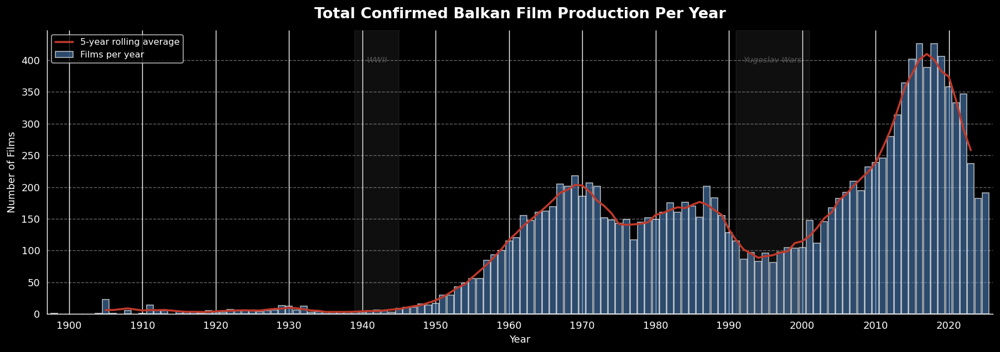

In [40]:
# ── Plot 1: Total confirmed Balkan films per year ─────────────────────────────
fig, ax = plt.subplots(figsize=(14, 5))

rolling = total_by_year.rolling(5, center=True).mean()

ax.bar(total_by_year.index, total_by_year.values,
       color='#4a7db5', alpha=0.6, width=0.9, label='Films per year')
ax.plot(total_by_year.index, rolling.values,
        color='#c0392b', linewidth=2, label='5-year rolling average')

for start, end, label in [(1939, 1945, 'WWII'), (1991, 2001, 'Yugoslav Wars')]:
    ax.axvspan(start, end, alpha=0.12, color='grey')
    ax.text((start + end) / 2, total_by_year.max() * 0.93, label,
            ha='center', fontsize=8, color='#555', style='italic')

ax.set_title('Total Confirmed Balkan Film Production Per Year', fontsize=15, fontweight='bold', pad=12)
ax.set_xlabel('Year')
ax.set_ylabel('Number of Films')
ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.legend(framealpha=0.8, fontsize=9)
ax.set_xlim(total_by_year.index.min() - 1, total_by_year.index.max() + 1)
ax.grid(axis='y', linestyle='--', alpha=0.4)
ax.spines[['top', 'right']].set_visible(False)

plt.tight_layout()
plt.savefig('data/confirmed_balkan_total_per_year.png', bbox_inches='tight')
plt.show()


In [42]:
# ── Plot 2: Stacked area — one film, one country ──────────────────────────────
fig, ax = plt.subplots(figsize=(15, 7))

colors = [COUNTRY_COLORS.get(c, '#888') for c in country_pivot.columns]

ax.stackplot(
    country_pivot.index,
    [country_pivot[c] for c in country_pivot.columns],
    labels=country_pivot.columns,
    colors=colors,
    alpha=0.85,
)

ax.set_title(
    'Confirmed Balkan Film Production Per Country — Stacked Area\n'
    '(each film counted once; grey = films with no clear primary country)',
    fontsize=13, fontweight='bold', pad=12
)
ax.set_xlabel('Year')
ax.set_ylabel('Number of Films')
ax.xaxis.set_major_locator(ticker.MultipleLocator(10))
ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
ax.set_xlim(country_pivot.index.min() - 1, country_pivot.index.max() + 1)
ax.grid(axis='y', linestyle='--', alpha=0.3)
ax.spines[['top', 'right']].set_visible(False)
ax.legend(loc='upper left', framealpha=0.85, fontsize=9, ncol=2)

plt.tight_layout()
plt.savefig('data/confirmed_balkan_per_country_stacked.png', bbox_inches='tight')
plt.show()


/tmp/ipykernel_11778/3861129106.py:28: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


KeyboardInterrupt: 

In [43]:
# ── Plot 3: Small multiples — classified countries only ───────────────────────
countries_to_plot = [c for c in country_pivot.columns if c != 'Unclassified']
ncols = 2
nrows = (len(countries_to_plot) + ncols - 1) // ncols

fig, axes = plt.subplots(nrows, ncols, figsize=(15, nrows * 3.2), sharey=False)
axes_flat = axes.flatten()

for i, country in enumerate(countries_to_plot):
    ax = axes_flat[i]
    series = country_pivot[country]
    active = series[series > 0]
    if active.empty:
        ax.set_visible(False)
        continue
    roll  = series.rolling(5, center=True).mean()
    color = COUNTRY_COLORS.get(country, '#888')

    ax.bar(series.index, series.values, color=color, alpha=0.5, width=0.9)
    ax.plot(roll.index, roll.values, color=color, linewidth=2)

    total = int(series.sum())
    ax.set_title(f'{country}  ({total:,} films)', fontsize=11, fontweight='bold', color=color)
    ax.set_ylabel('Films')
    ax.xaxis.set_major_locator(ticker.MultipleLocator(20))
    ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True, nbins=4))
    ax.grid(axis='y', linestyle='--', alpha=0.4)
    ax.spines[['top', 'right']].set_visible(False)
    ax.set_xlim(active.index.min() - 2, series.index.max() + 1)

for j in range(i + 1, len(axes_flat)):
    axes_flat[j].set_visible(False)

fig.suptitle(
    'Confirmed Balkan Film Production Per Country\n'
    '(classified films only — each film counted once)',
    fontsize=15, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.savefig('data/confirmed_balkan_per_country_subplots.png', bbox_inches='tight')
plt.show()


KeyboardInterrupt: 